# Q2. Speech enhancement

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq, ifft
import scipy.io.wavfile as scw
import scipy
import IPython.display as ipd

def spec(x, name=None):
    x[abs(x) <= 0] = 1e-16
    plt.figure(figsize=(8,4))
    plt.imshow(20 * np.log10(abs(x) / np.max(abs(x))), aspect='auto', cmap='jet', origin='lower', vmin=-100, vmax=1)
    plt.colorbar()
    plt.ylabel('Frequency')
    plt.xlabel('Frame')
    plt.title(name)
    plt.show()

# Define the array parameters
M = 4          # the number of elements
d = 0.04       # inter-element spacing (m)
c = 343        # speed of sound (m/s)

In [106]:
fs, Q2_1 = scw.read('Project_audio/Q2_1.wav')
fs, Q2_2 = scw.read('Project_audio/Q2_2.wav')
fs, Q2_3_1 = scw.read('Project_audio/Q2_3_1.wav')
fs, Q2_3_2 = scw.read('Project_audio/Q2_3_2.wav')

In [8]:
# # VAD: 3~8s
# start = 3 * fs
# end = 8 * fs

# Q2_1[:start, :] = 0
# Q2_1[end:, :] = 0
# Q2_2[:start, :] = 0
# Q2_2[end:, :] = 0
# Q2_3_1[:start, :] = 0
# Q2_3_1[end:, :] = 0
# Q2_3_2[:start, :] = 0
# Q2_3_2[end:, :] = 0

### Q2_1

In [103]:
# Delay and sum
def Q2_1_enhance(signal, theta):
    """Localization using delay and sum 
    Args:
        signal: received signal
    Return:
        theta: angle of sound source
    """
    sig_stft = []
    for i in range(M):
        f, t, Zxx = scipy.signal.stft(signal[:, i], fs=fs, nperseg=256, noverlap=128)
        sig_stft.append(Zxx)
    sig_stft = np.array(sig_stft)

    theta_target = theta / 180 * np.pi

    Y = np.zeros_like(sig_stft[0], dtype=complex)

    for j, f_j in enumerate(f):
        k = 2 * np.pi * f_j / c
        w_DAS = (1 / M) * np.exp(1j * np.arange(M) * k * d * np.sin(theta_target))
        X = sig_stft[:, j, :]
        Y[j, :] = np.dot(np.conj(w_DAS).T, X)

    return Y

Channel 1 original


Enhanced


Enhanced (target = -61)


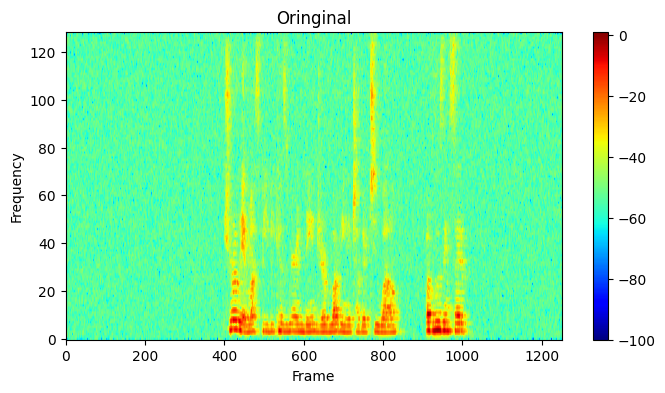

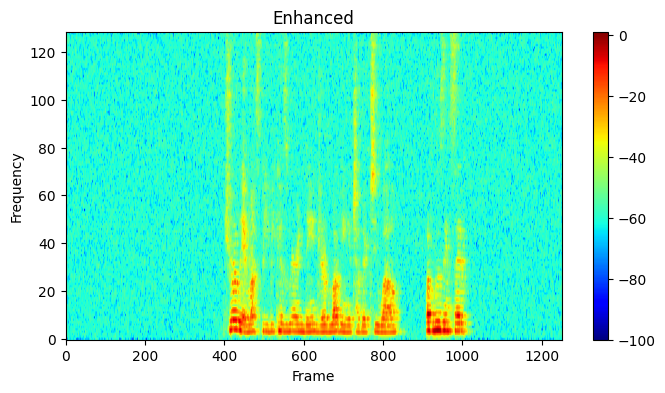

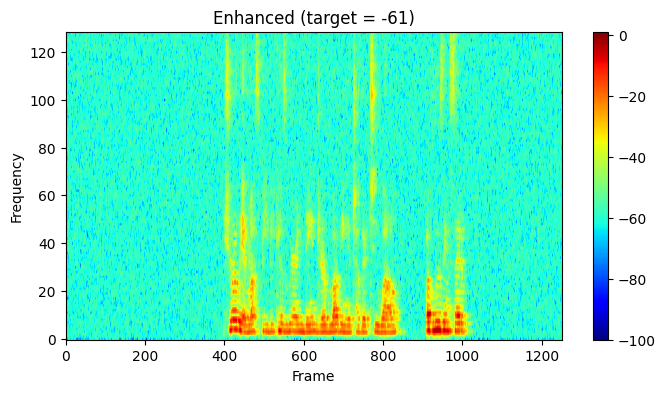

In [107]:
Y = Q2_1_enhance(signal=Q2_1, theta=-0.5)
y = scipy.signal.istft(Y, fs=fs, nperseg=256, noverlap=128)[1]
y = np.asarray(y, dtype=np.int16)

Y_answer = Q2_1_enhance(signal=Q2_1, theta=-61)
y_answer = scipy.signal.istft(Y_answer, fs=fs, nperseg=256, noverlap=128)[1]
y_answer = np.asarray(y_answer, dtype=np.int16)

print('Channel 1 original')
ipd.display(ipd.Audio(Q2_1[:, 0], rate=fs))
print('Enhanced')
ipd.display(ipd.Audio(y, rate=fs))
print('Enhanced (target = -61)')
ipd.display(ipd.Audio(y_answer, rate=fs))

spec(scipy.signal.stft(Q2_1[:, 0], fs=fs, nperseg=256, noverlap=128)[2], name='Oringinal')
spec(Y, name='Enhanced')
spec(Y_answer, name='Enhanced (target = -61)')

# scw.write('Q2_1_111061530.wav', rate=fs, data=y)

### Q2_2

Channel 1 original


Enhanced


Enhanced (target = 79)


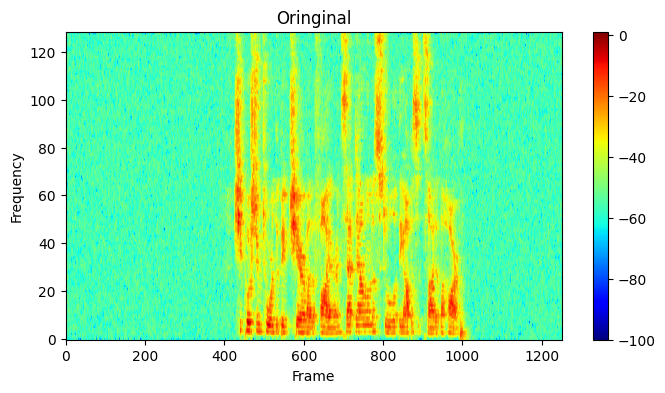

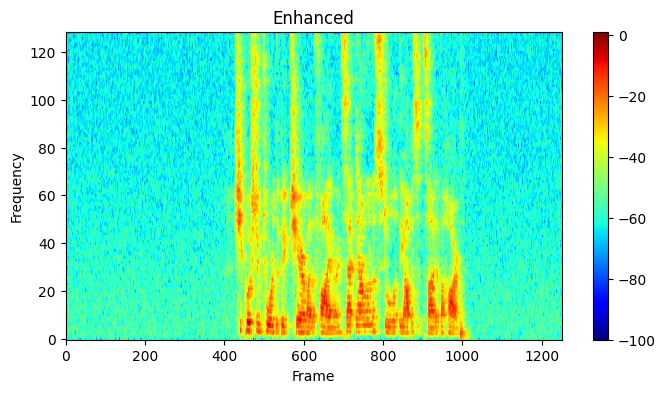

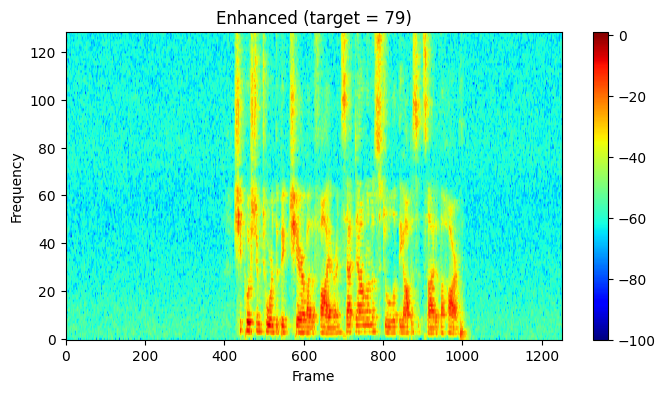

In [98]:
Y = Q2_1_enhance(signal=Q2_2, theta=1.00)
y = scipy.signal.istft(Y, fs=fs, nperseg=256, noverlap=128)[1]
y = np.asarray(y, dtype=np.int16)
Y_answer = Q2_1_enhance(signal=Q2_2, theta=79.00)
y_answer = scipy.signal.istft(Y_answer, fs=fs, nperseg=256, noverlap=128)[1]
y_answer = np.asarray(y_answer, dtype=np.int16)

print('Channel 1 original')
ipd.display(ipd.Audio(Q2_2[:, 0], rate=fs))
print('Enhanced')
ipd.display(ipd.Audio(y, rate=fs))
print('Enhanced (target = 79)')
ipd.display(ipd.Audio(y_answer, rate=fs))

spec(scipy.signal.stft(Q2_2[:, 0], fs=fs, nperseg=256, noverlap=128)[2], name='Oringinal')
spec(Y, name='Enhanced')
spec(Y_answer, name='Enhanced (target = 79)')

# scw.write('Q2_2_111061530.wav', rate=fs, data=y)

In [5]:
# MVDR
def Q2_2_enhance(signal, theta):
    """Localization using MVDR
    Args:
        signal: received signal
    Return:
        theta: angle of sound source
    """
    sig_stft = []
    for i in range(M):
        f, t, Zxx = scipy.signal.stft(signal[:, i], fs=fs, nperseg=256, noverlap=128)
        sig_stft.append(Zxx)
    sig_stft = np.array(sig_stft)

    theta_target = theta / 180 * np.pi

    Y = np.zeros_like(sig_stft[0], dtype=complex)

    for j, f_j in enumerate(f):
        k = 2 * np.pi * f_j / c
        a = np.exp(1j * np.arange(M) * k * d * np.sin(theta_target))
        X = sig_stft[:, j, :]
        # Rxx = np.dot(X, np.conj(X).T) / X.shape[1]
        Rxx = np.outer(a, np.conj(a).T)
        I = np.eye(M)
        eps = np.finfo(np.float32).eps
        w_MVDR = np.dot(np.linalg.inv(Rxx+eps*I), a) / np.dot(np.conj(a).T, np.dot(np.linalg.inv(Rxx+eps*I), a))
        # w_MVDR = np.dot(np.linalg.inv(Rxx), a) / np.dot(np.conj(a).T, np.dot(np.linalg.inv(Rxx), a))
        
        Y[j, :] = np.dot(np.conj(w_MVDR).T, X)

    return Y

Channel 1 original


Enhanced (target = 79)


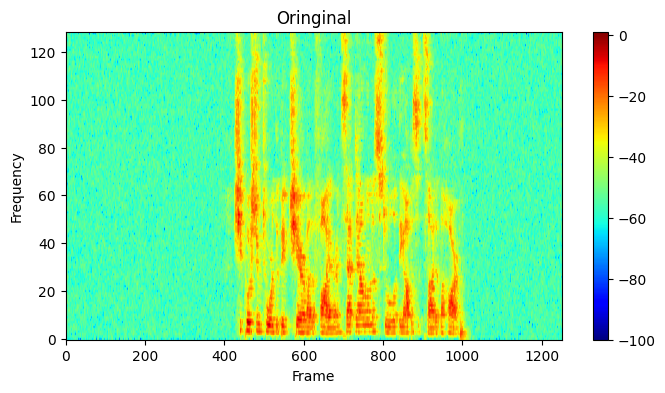

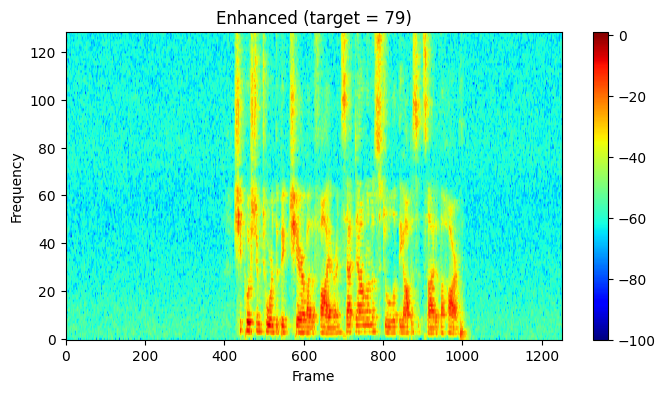

In [7]:
Y = Q2_2_enhance(signal=Q2_2, theta=79.00)
y = scipy.signal.istft(Y, fs=fs, nperseg=256, noverlap=128)

print('Channel 1 original')
ipd.display(ipd.Audio(Q2_2[:, 0], rate=fs))
print('Enhanced (target = 79)')
ipd.display(ipd.Audio(y[1], rate=fs))

spec(scipy.signal.stft(Q2_2[:, 0], fs=fs, nperseg=256, noverlap=128)[2], name='Oringinal')
spec(Y, name='Enhanced (target = 79)')

### Q2_3_1

DAS

Channel 1 original


Enhanced


Enhanced (target = 72.5)


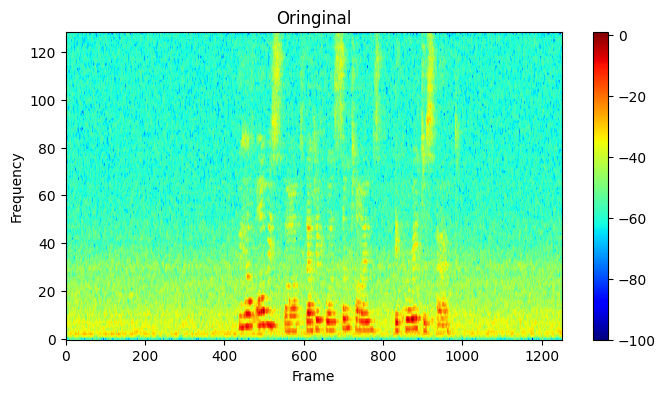

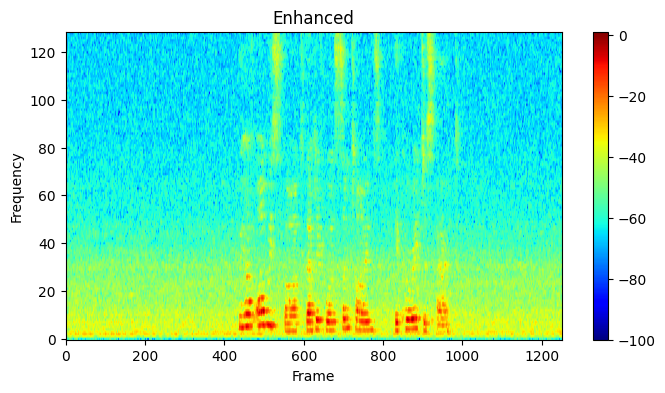

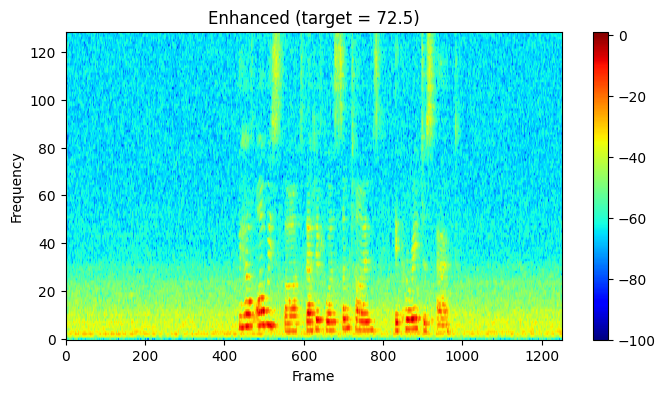

In [8]:
Y = Q2_1_enhance(signal=Q2_3_1, theta=1.00)
y = scipy.signal.istft(Y, fs=fs, nperseg=256, noverlap=128)[1]
y = np.asarray(y, dtype=np.int16)
Y_answer = Q2_1_enhance(signal=Q2_3_1, theta=72.5)
y_answer = scipy.signal.istft(Y_answer, fs=fs, nperseg=256, noverlap=128)[1]
y_answer = np.asarray(y_answer, dtype=np.int16)

print('Channel 1 original')
ipd.display(ipd.Audio(Q2_3_1[:, 0], rate=fs))
print('Enhanced')
ipd.display(ipd.Audio(y, rate=fs))
print('Enhanced (target = 72.5)')
ipd.display(ipd.Audio(y_answer, rate=fs))

spec(scipy.signal.stft(Q2_3_1[:, 0], fs=fs, nperseg=256, noverlap=128)[2], name='Oringinal')
spec(Y, name='Enhanced')
spec(Y_answer, name='Enhanced (target = 72.5)')

# scw.write('Q2_3_1_111061530.wav', rate=fs, data=y)

LCMV

In [108]:
# LCMV
def Q2_3_enhance(signal, target, interferer):
    """Localization using LCMV
    Args:
        signal: received signal
    Return:
        target: angle of target source
        interferer: angle of interferer
    """
    sig_stft = []
    for i in range(M):
        f, t, Zxx = scipy.signal.stft(signal[:, i], fs=fs, nperseg=256, noverlap=128)
        sig_stft.append(Zxx)
    sig_stft = np.array(sig_stft)

    theta_target = target / 180 * np.pi
    theta_interferer = interferer / 180 * np.pi

    Y = np.zeros_like(sig_stft[0], dtype=complex)
    C = np.zeros((M, 2), dtype=complex)
    g = np.array([1, 0])

    for j, f_j in enumerate(f):
        k = 2 * np.pi * f_j / c
        C[:, 0] = np.exp(1j * np.arange(M) * k * d * np.sin(theta_target))
        C[:, 1] = np.exp(1j * np.arange(M) * k * d * np.sin(theta_interferer))
        X = sig_stft[:, j, :]
        Rxx = np.dot(X, np.conj(X).T) / X.shape[1]
        # Rxx = np.outer(C[:, 0], np.conj(C[:, 0]).T)
        eps = np.finfo(np.float32).eps
        mu = 1e-12
        w_LCMV = np.dot(np.dot(np.linalg.inv(Rxx + eps * np.eye(M)), C), np.linalg.inv(np.dot(np.dot(np.conjugate(C).T, (np.linalg.inv(Rxx + eps * np.eye(M)))), C) + mu * np.eye(2))) @ g
        
        Y[j, :] = np.dot(np.conj(w_LCMV).T, X)

    return Y

Channel 1 original


Enhanced (target = 72.5, interferer = -83)


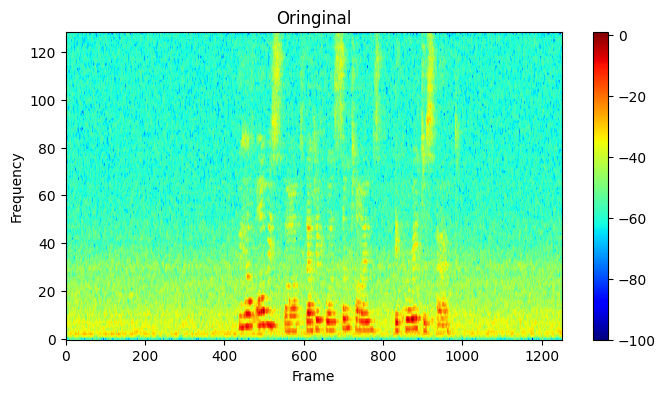

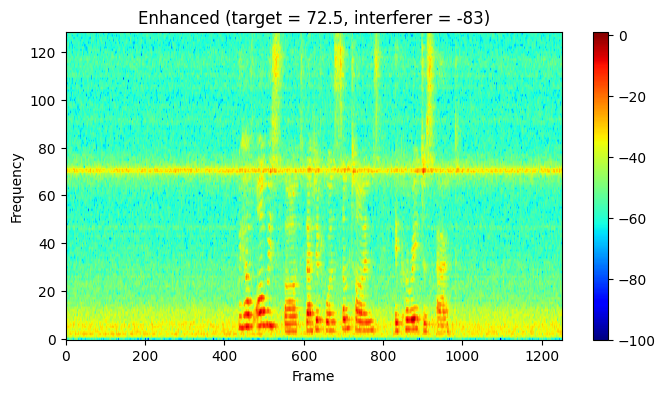

In [141]:
interferer = -83
Y = Q2_3_enhance(signal=Q2_3_1, target=72.5, interferer=interferer)
y = scipy.signal.istft(Y, fs=fs, nperseg=256, noverlap=128)[1]
y = np.asarray(y, dtype=np.int16)

print('Channel 1 original')
ipd.display(ipd.Audio(Q2_3_1[:, 0], rate=fs))
print(f'Enhanced (target = 72.5, interferer = {interferer})')
ipd.display(ipd.Audio(y, rate=fs))

spec(scipy.signal.stft(Q2_3_1[:, 0], fs=fs, nperseg=256, noverlap=128)[2], name='Oringinal')
spec(Y, name=f'Enhanced (target = 72.5, interferer = {interferer})')

### Q2_3_2

DAS

Channel 1 original


Enhanced


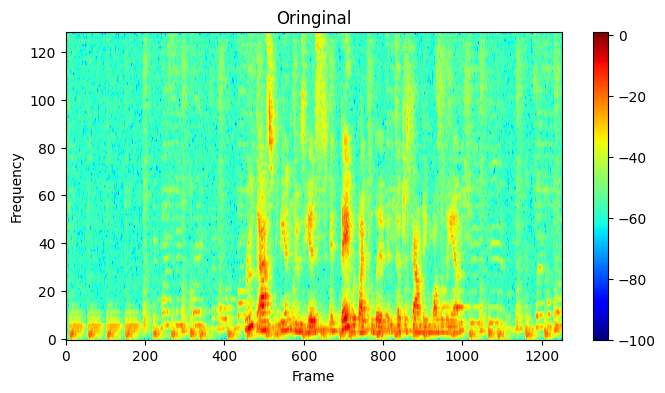

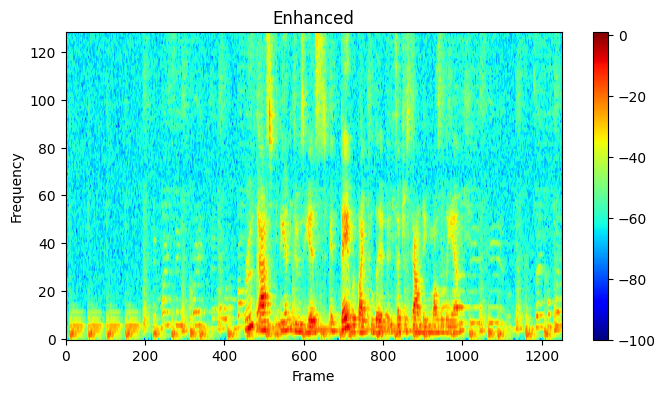

In [142]:
Y = Q2_1_enhance(signal=Q2_3_2, theta=86.5)
y = scipy.signal.istft(Y, fs=fs, nperseg=256, noverlap=128)[1]
# y = np.asarray(y, dtype=np.int16)

print('Channel 1 original')
ipd.display(ipd.Audio(Q2_3_2[:, 0], rate=fs))
print('Enhanced')
ipd.display(ipd.Audio(y, rate=fs))

spec(scipy.signal.stft(Q2_3_2[:, 0], fs=fs, nperseg=256, noverlap=128)[2], name='Oringinal')
spec(Y, name='Enhanced')

# scw.write('Q2_3_2_111061530.wav', rate=fs, data=y)

LCMV

Channel 1 original


Enhanced (target = 86.5, interferer = -65)


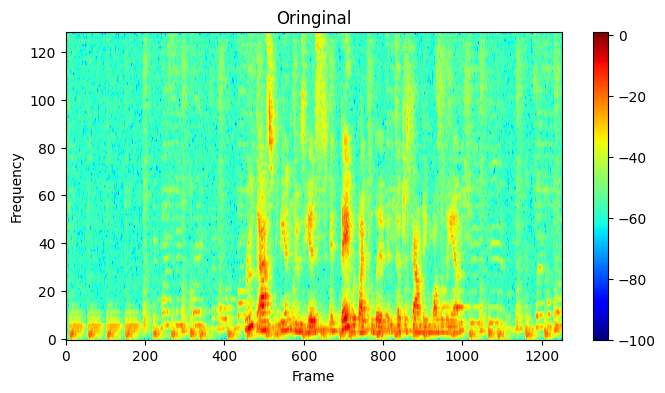

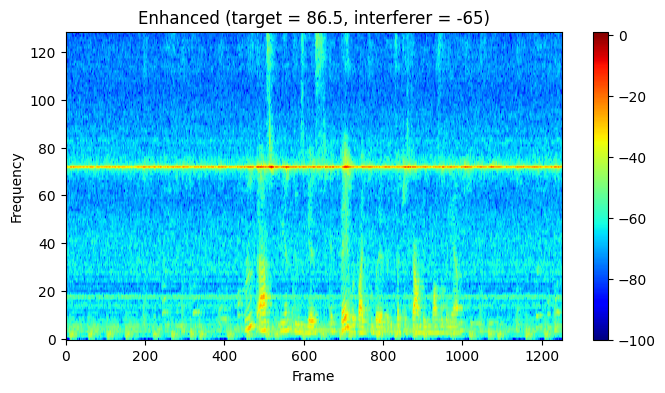

In [132]:
interferer = -65
Y = Q2_3_enhance(signal=Q2_3_2, target=86.5, interferer=interferer)
y = scipy.signal.istft(Y, fs=fs, nperseg=256, noverlap=128)[1]
y = np.asarray(y, dtype=np.int16)

print('Channel 1 original')
ipd.display(ipd.Audio(Q2_3_2[:, 0], rate=fs))
print(f'Enhanced (target = 86.5, interferer = {interferer})')
ipd.display(ipd.Audio(y, rate=fs))

spec(scipy.signal.stft(Q2_3_2[:, 0], fs=fs, nperseg=256, noverlap=128)[2], name='Oringinal')
spec(Y, name=f'Enhanced (target = 86.5, interferer = {interferer})')